## 1 网页跳转1

In [1]:
from plotly.offline import plot
import plotly.graph_objs as go
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.offline as pltoff

plot([go.Scatter(x=[1, 2, 3], y=[3, 2, 6])], filename='my-graph.html')
    # We can also download an image of the plot by setting the image parameter
    # to the image format we want
plot([go.Scatter(x=[1, 2, 3], y=[3, 2, 6])], filename='my-graph.html',image='jpeg')

'my-graph.html'

## 2 网页跳转2

In [2]:
from plotly.offline import plot
figure = {'data': [{'x': [0, 1], 'y': [0, 1]}],
          'layout': {'xaxis': {'range': [0, 5], 'autorange': False},
                     'yaxis': {'range': [0, 5], 'autorange': False},
                     'title': 'Start Title'},
          'frames': [{'data': [{'x': [1, 2], 'y': [1, 2]}]},
                     {'data': [{'x': [1, 4], 'y': [1, 4]}]},
                     {'data': [{'x': [3, 4], 'y': [3, 4]}],
                      'layout': {'title': 'End Title'}}]}
plot(figure, animation_opts={'frame': {'duration': 1}})

'temp-plot.html'

## 4 显示图片1

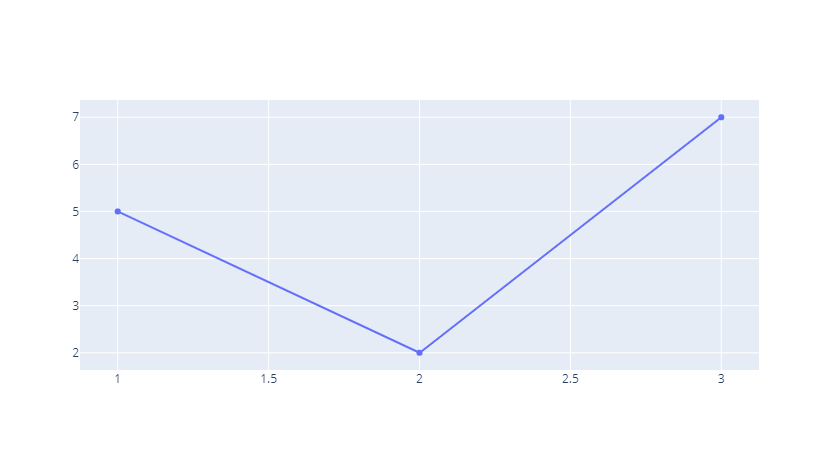

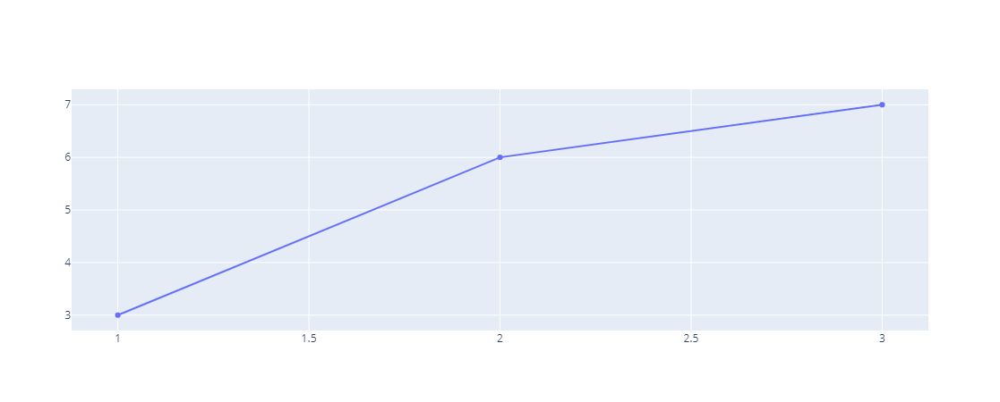

In [3]:
from plotly.offline import init_notebook_mode, iplot

init_notebook_mode()
iplot([{'x': [1, 2, 3], 'y': [5, 2, 7]}])
# We can also download an image of the plot by setting the image to the format you want. e.g. `image='png'
iplot([{'x': [1, 2, 3], 'y': [3, 6, 7]}],image='png')


## 5 显示图片2

D:\Program Files (x86)\anaconda3\envs\stock\lib\site-packages\plotly\matplotlylib\mpltools.py:368: MatplotlibDeprecationWarning:


The is_frame_like function was deprecated in Matplotlib 3.1 and will be removed in 3.3.



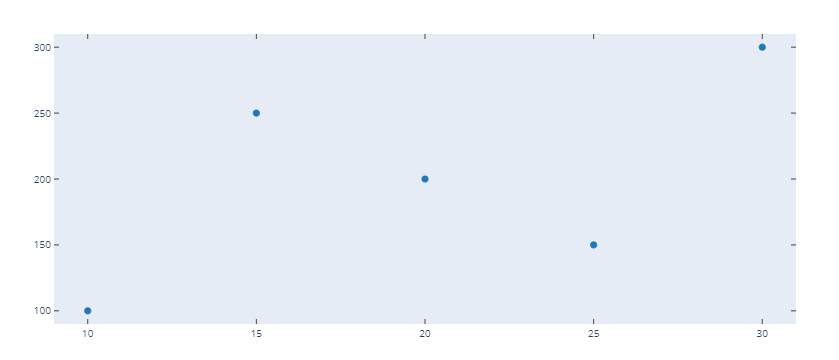

In [4]:
from plotly.offline import init_notebook_mode, iplot_mpl
import matplotlib.pyplot as plt

fig = plt.figure()
x = [10, 15, 20, 25, 30]
y = [100, 250, 200, 150, 300]
plt.plot(x, y, "o")

init_notebook_mode()
#iplot_mpl(fig)
# and if you want to download an image of the figure as well
iplot_mpl(fig, image='jpeg')

## 6 图片显示3

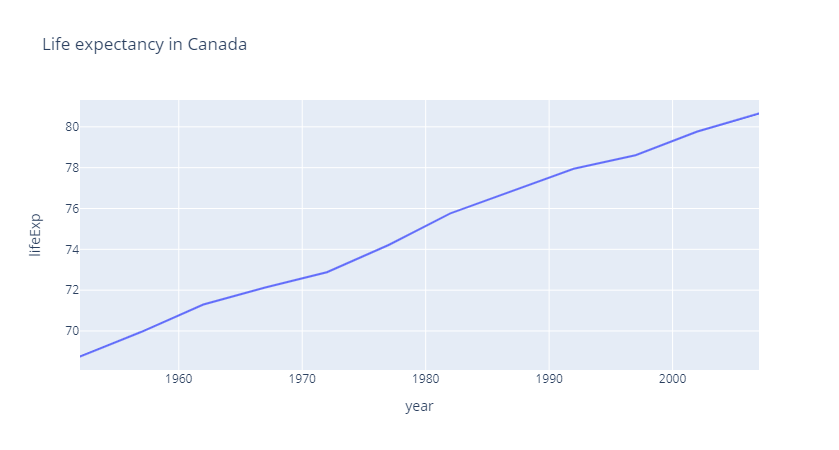

In [5]:
import plotly.express as px
import plotly.io as pio

df = px.data.gapminder().query("country=='Canada'")
fig = px.line(df, x="year", y="lifeExp", title='Life expectancy in Canada')

fig.show()

#图片保存本地， 1.png 即保存到当前目录  D:\\指定路径     
pio.write_image(fig, 'D:\\1.png')

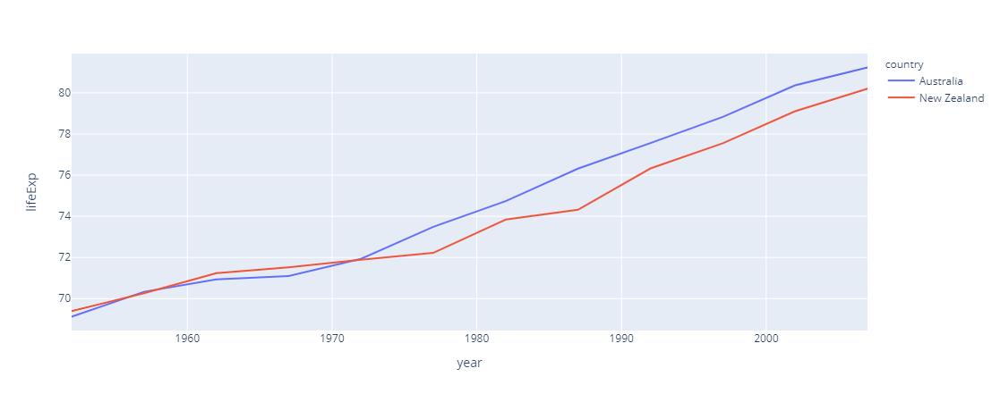

In [6]:
import plotly.express as px

df = px.data.gapminder().query("continent=='Oceania'")
fig = px.line(df, x="year", y="lifeExp", color='country')
fig.show()

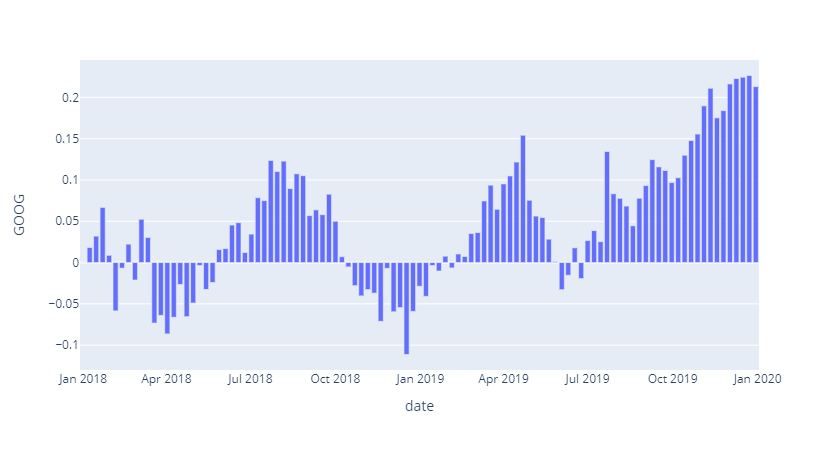

In [7]:
import plotly.express as px

df = px.data.stocks(indexed=True)-1
fig = px.bar(df, x=df.index, y="GOOG")
fig.show()

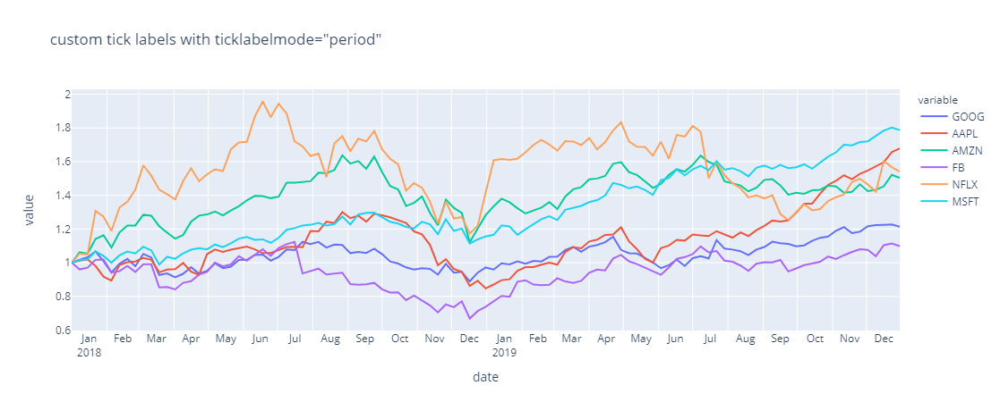

In [3]:
import plotly.express as px
df = px.data.stocks()
fig = px.line(df, x="date", y=df.columns,
              hover_data={"date": "|%B %d, %Y"},
              title='custom tick labels with ticklabelmode="period"')
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y",
    ticklabelmode="period")
fig.show()

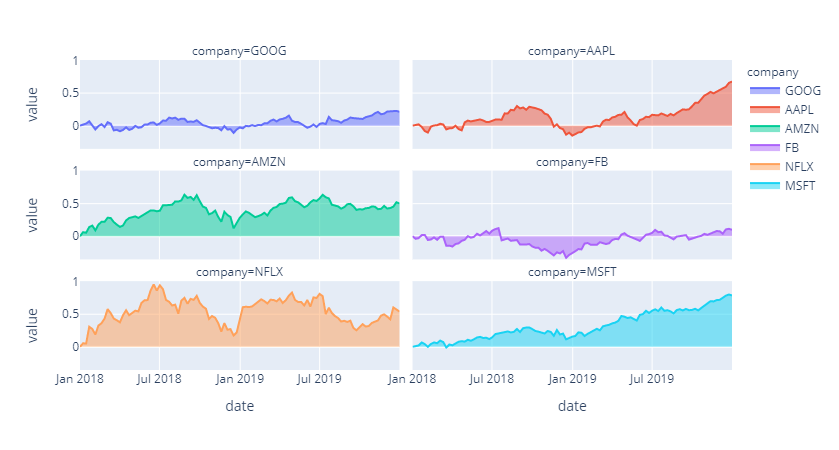

In [9]:
import plotly.express as px

df = px.data.stocks(indexed=True)-1
fig = px.area(df, facet_col="company", facet_col_wrap=2)
fig.show()

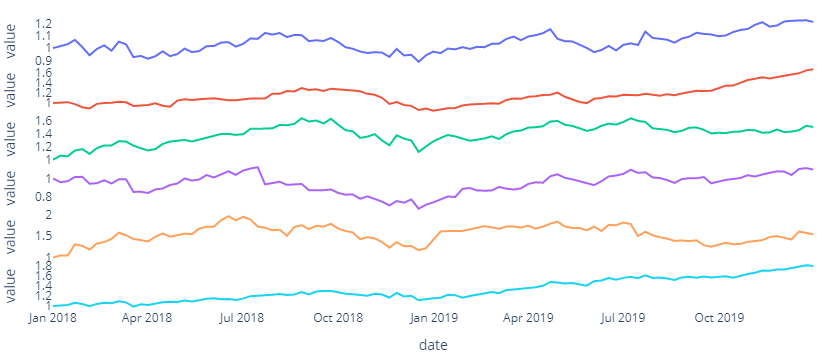

In [10]:
import plotly.express as px
df = px.data.stocks(indexed=True)
fig = px.line(df, facet_row="company", facet_row_spacing=0.01, height=300, width=600)

# hide and lock down axes
fig.update_xaxes(visible=True, fixedrange=True)
fig.update_yaxes(visible=True, fixedrange=True)

# remove facet/subplot labels
fig.update_layout(annotations=[], overwrite=True)

# strip down the rest of the plot
fig.update_layout(
    showlegend=False,
    plot_bgcolor="white",
    margin=dict(t=10,l=10,b=10,r=10)
)

# disable the modebar for such a small plot
fig.show(config=dict(displayModeBar=False))

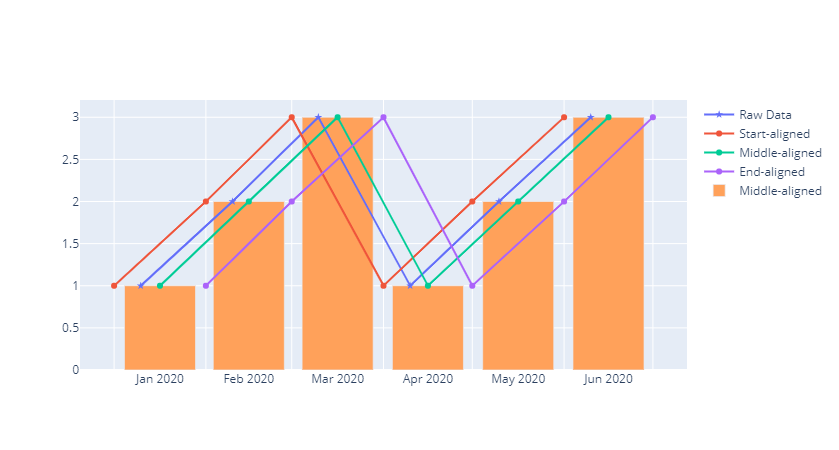

In [11]:
import plotly.graph_objects as go
import pandas as pd

df = pd.DataFrame(dict(
    date=["2020-01-10", "2020-02-10", "2020-03-10", "2020-04-10", "2020-05-10", "2020-06-10"],
    value=[1,2,3,1,2,3]
))

fig = go.Figure()
fig.add_trace(go.Scatter(
    name="Raw Data",
    mode="markers+lines", x=df["date"], y=df["value"],
    marker_symbol="star"
))
fig.add_trace(go.Scatter(
    name="Start-aligned",
    mode="markers+lines", x=df["date"], y=df["value"],
    xperiod="M1",
    xperiodalignment="start"
))
fig.add_trace(go.Scatter(
    name="Middle-aligned",
    mode="markers+lines", x=df["date"], y=df["value"],
    xperiod="M1",
    xperiodalignment="middle"
))
fig.add_trace(go.Scatter(
    name="End-aligned",
    mode="markers+lines", x=df["date"], y=df["value"],
    xperiod="M1",
    xperiodalignment="end"
))
fig.add_trace(go.Bar(
    name="Middle-aligned",
    x=df["date"], y=df["value"],
    xperiod="M1",
    xperiodalignment="middle"
))
fig.update_xaxes(showgrid=True, ticklabelmode="period")
fig.show()

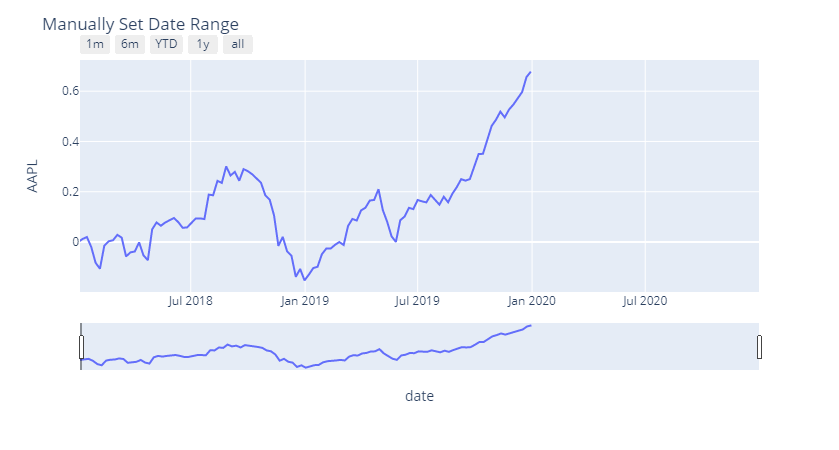

In [12]:
import plotly.graph_objects as go
import pandas as pd

df = px.data.stocks(indexed=True)-1
fig = px.line(df, y='AAPL')

# Use date string to set xaxis range
fig.update_layout(xaxis_range=['2018-07-01','2020-12-31'],
                  title_text="Manually Set Date Range")
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

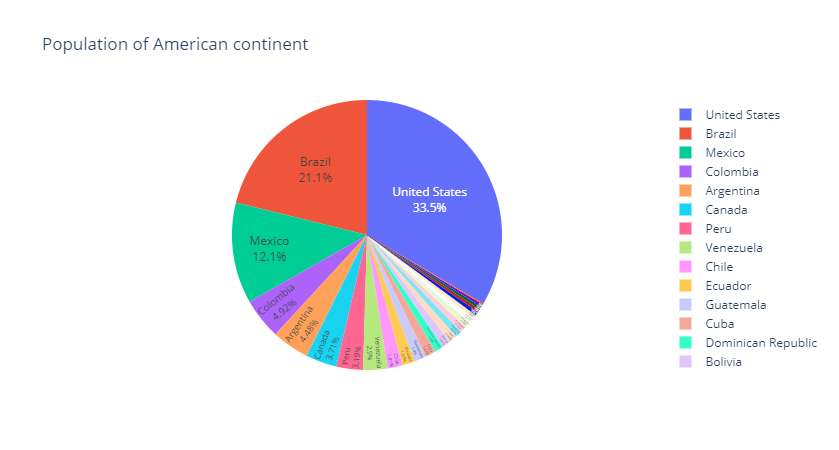

In [13]:
import plotly.express as px
df = px.data.gapminder().query("year == 2007").query("continent == 'Americas'")
fig = px.pie(df, values='pop', names='country',
             title='Population of American continent',
             hover_data=['lifeExp'], labels={'lifeExp':'life expectancy'})
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

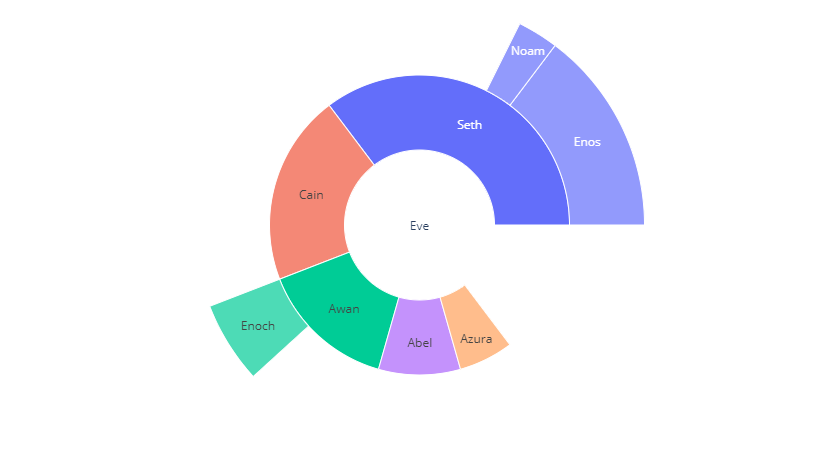

In [14]:
import plotly.graph_objects as go

fig =go.Figure(go.Sunburst(
    labels=["Eve", "Cain", "Seth", "Enos", "Noam", "Abel", "Awan", "Enoch", "Azura"],
    parents=["", "Eve", "Eve", "Seth", "Seth", "Eve", "Eve", "Awan", "Eve" ],
    values=[10, 14, 12, 10, 2, 6, 6, 4, 4],
))
fig.update_layout(margin = dict(t=0, l=0, r=0, b=0))

fig.show()

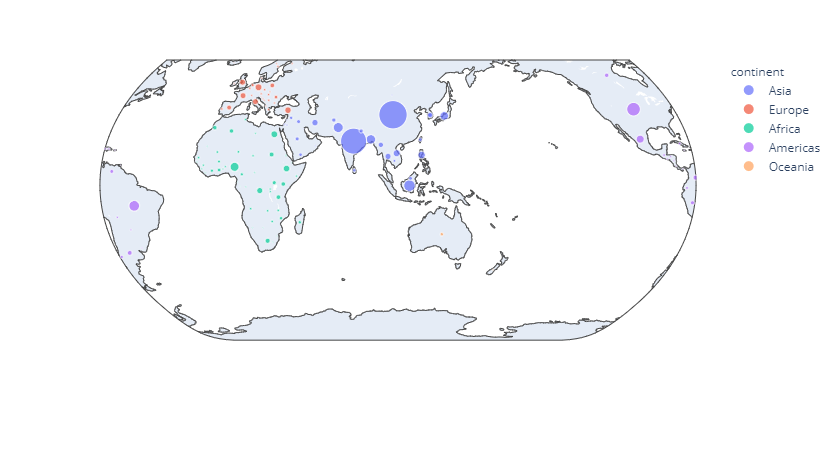

In [15]:
import plotly.express as px
df = px.data.gapminder().query("year==2007")
fig = px.scatter_geo(df, locations="iso_alpha", color="continent",
                     hover_name="country", size="pop",
                     projection="natural earth")
fig.show()

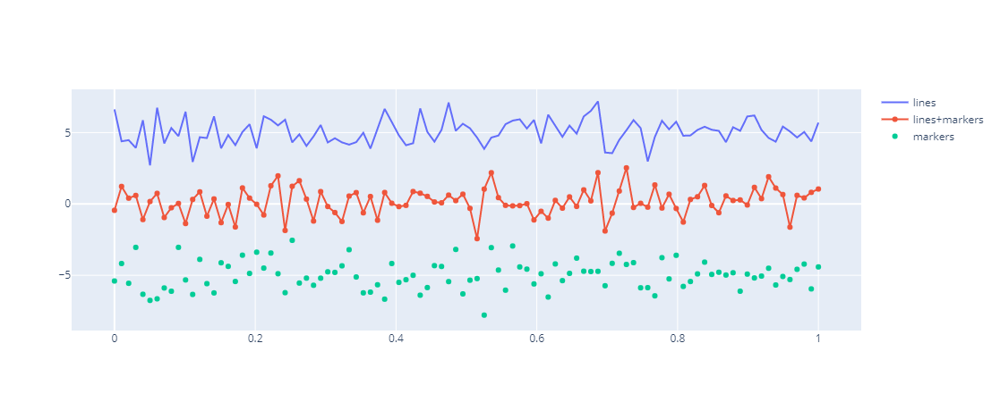

In [16]:
import plotly.graph_objects as go

# Create random data with numpy
import numpy as np
np.random.seed(1)

N = 100
random_x = np.linspace(0, 1, N)
random_y0 = np.random.randn(N) + 5
random_y1 = np.random.randn(N)
random_y2 = np.random.randn(N) - 5

# Create traces
fig = go.Figure()
fig.add_trace(go.Scatter(x=random_x, y=random_y0,
                    mode='lines',
                    name='lines'))
fig.add_trace(go.Scatter(x=random_x, y=random_y1,
                    mode='lines+markers',
                    name='lines+markers'))
fig.add_trace(go.Scatter(x=random_x, y=random_y2,
                    mode='markers', name='markers'))

fig.show()

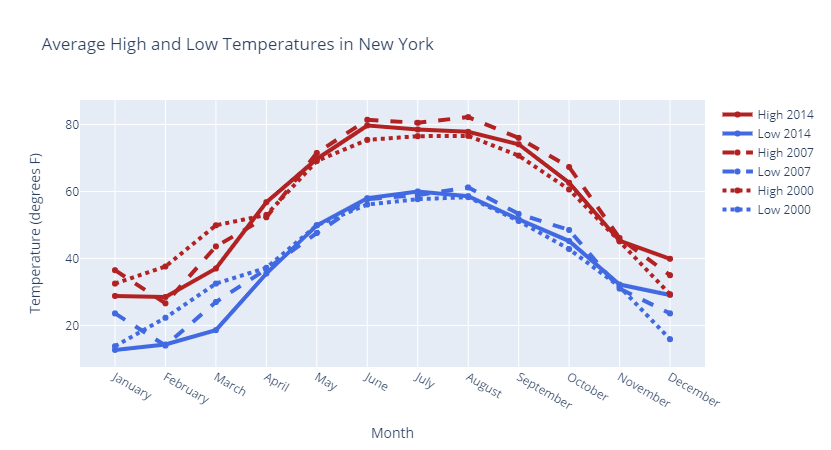

In [17]:
import plotly.graph_objects as go

# Add data
month = ['January', 'February', 'March', 'April', 'May', 'June', 'July',
         'August', 'September', 'October', 'November', 'December']
high_2000 = [32.5, 37.6, 49.9, 53.0, 69.1, 75.4, 76.5, 76.6, 70.7, 60.6, 45.1, 29.3]
low_2000 = [13.8, 22.3, 32.5, 37.2, 49.9, 56.1, 57.7, 58.3, 51.2, 42.8, 31.6, 15.9]
high_2007 = [36.5, 26.6, 43.6, 52.3, 71.5, 81.4, 80.5, 82.2, 76.0, 67.3, 46.1, 35.0]
low_2007 = [23.6, 14.0, 27.0, 36.8, 47.6, 57.7, 58.9, 61.2, 53.3, 48.5, 31.0, 23.6]
high_2014 = [28.8, 28.5, 37.0, 56.8, 69.7, 79.7, 78.5, 77.8, 74.1, 62.6, 45.3, 39.9]
low_2014 = [12.7, 14.3, 18.6, 35.5, 49.9, 58.0, 60.0, 58.6, 51.7, 45.2, 32.2, 29.1]

fig = go.Figure()
# Create and style traces
fig.add_trace(go.Scatter(x=month, y=high_2014, name='High 2014',
                         line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x=month, y=low_2014, name = 'Low 2014',
                         line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x=month, y=high_2007, name='High 2007',
                         line=dict(color='firebrick', width=4,
                              dash='dash') # dash options include 'dash', 'dot', and 'dashdot'
))
fig.add_trace(go.Scatter(x=month, y=low_2007, name='Low 2007',
                         line = dict(color='royalblue', width=4, dash='dash')))
fig.add_trace(go.Scatter(x=month, y=high_2000, name='High 2000',
                         line = dict(color='firebrick', width=4, dash='dot')))
fig.add_trace(go.Scatter(x=month, y=low_2000, name='Low 2000',
                         line=dict(color='royalblue', width=4, dash='dot')))

# Edit the layout
fig.update_layout(title='Average High and Low Temperatures in New York',
                   xaxis_title='Month',
                   yaxis_title='Temperature (degrees F)')


fig.show()

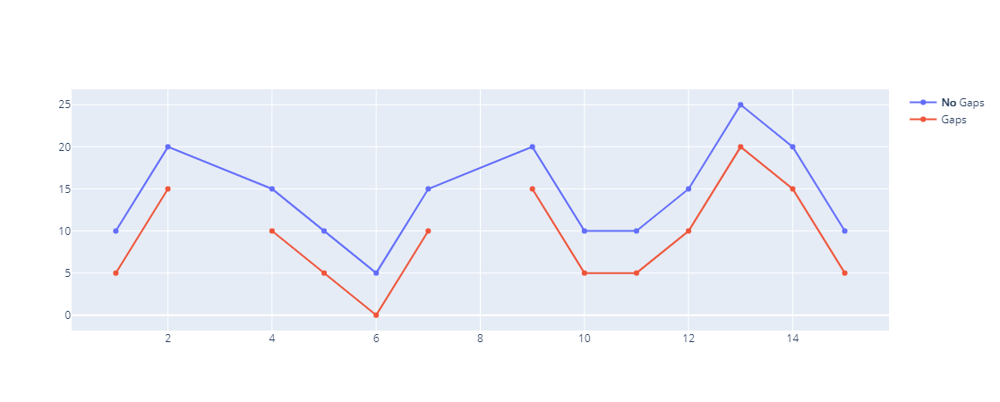

In [18]:
import plotly.graph_objects as go

x = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=x,
    y=[10, 20, None, 15, 10, 5, 15, None, 20, 10, 10, 15, 25, 20, 10],
    name = '<b>No</b> Gaps', # Style name/legend entry with html tags
    connectgaps=True # override default to connect the gaps
))
fig.add_trace(go.Scatter(
    x=x,
    y=[5, 15, None, 10, 5, 0, 10, None, 15, 5, 5, 10, 20, 15, 5],
    name='Gaps',
))

fig.show()

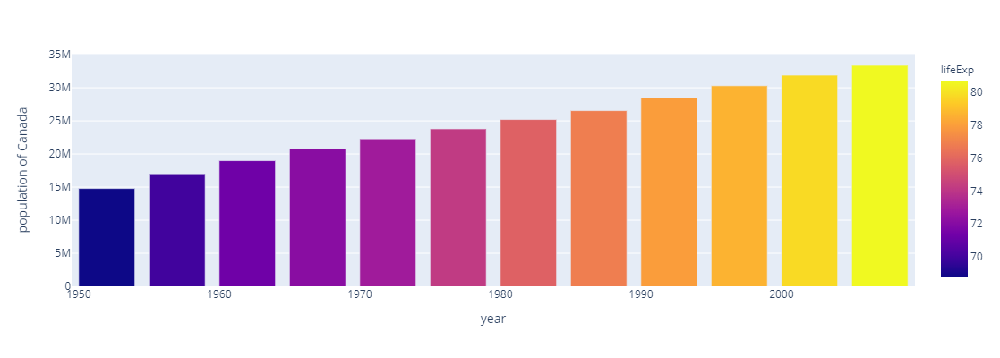

In [19]:
import plotly.express as px
data = px.data.gapminder()

data_canada = data[data.country == 'Canada']
fig = px.bar(data_canada, x='year', y='pop',
             hover_data=['lifeExp', 'gdpPercap'], color='lifeExp',
             labels={'pop':'population of Canada'}, height=400)
fig.show()

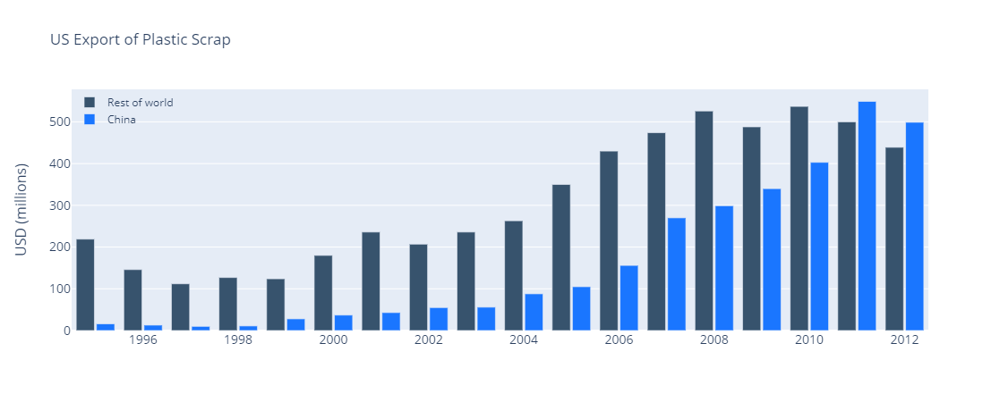

In [9]:
import plotly.graph_objects as go

years = [1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003,
         2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012]

fig = go.Figure()
fig.add_trace(go.Bar(x=years,
                y=[219, 146, 112, 127, 124, 180, 236, 207, 236, 263,
                   350, 430, 474, 526, 488, 537, 500, 439],
                name='Rest of world',
                marker_color='rgb(55, 83, 109)'
                ))
fig.add_trace(go.Bar(x=years,
                y=[16, 13, 10, 11, 28, 37, 43, 55, 56, 88, 105, 156, 270,
                   299, 340, 403, 549, 499],
                name='China',
                marker_color='rgb(26, 118, 255)'
                ))

fig.update_layout(
    title='US Export of Plastic Scrap',
    xaxis_tickfont_size=14,
    yaxis=dict(
        title='USD (millions)',
        titlefont_size=16,
        tickfont_size=14,
    ),
    legend=dict(
        x=0,
        y=1,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'        
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()

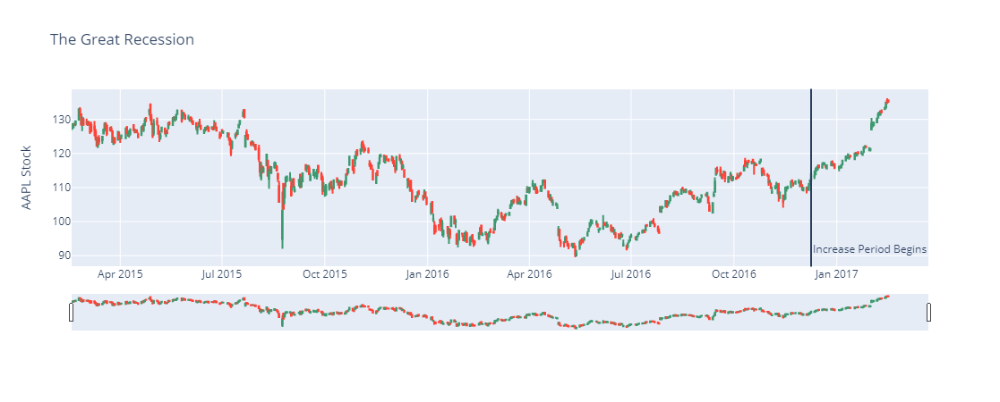

In [21]:
import plotly.graph_objects as go
import pandas as pd


df = pd.read_csv('..\\JN_DataWarehouse\\plotly\\finance-charts-apple.csv')

fig = go.Figure(data=[go.Candlestick(x=df['Date'],
                open=df['AAPL.Open'], high=df['AAPL.High'],
                low=df['AAPL.Low'], close=df['AAPL.Close'])
                      ])

fig.update_layout(
    title='The Great Recession',
    yaxis_title='AAPL Stock',
    shapes = [dict(
        x0='2016-12-09', x1='2016-12-09', y0=0, y1=1, xref='x', yref='paper',
        line_width=2)],
    annotations=[dict(
        x='2016-12-09', y=0.05, xref='x', yref='paper',
        showarrow=False, xanchor='left', text='Increase Period Begins')]
)

fig.show()

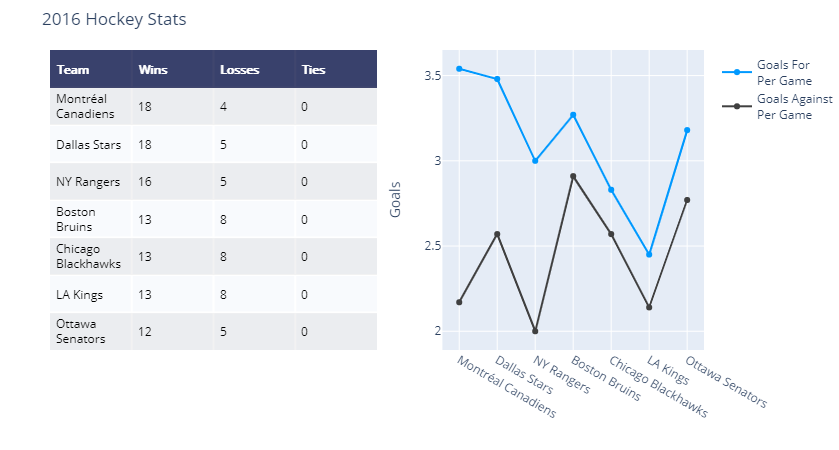

In [22]:
import plotly.graph_objs as go
import plotly.figure_factory as ff

# Add table data
table_data = [['Team', 'Wins', 'Losses', 'Ties'],
              ['Montréal<br>Canadiens', 18, 4, 0],
              ['Dallas Stars', 18, 5, 0],
              ['NY Rangers', 16, 5, 0],
              ['Boston<br>Bruins', 13, 8, 0],
              ['Chicago<br>Blackhawks', 13, 8, 0],
              ['LA Kings', 13, 8, 0],
              ['Ottawa<br>Senators', 12, 5, 0]]
# Initialize a figure with ff.create_table(table_data)
fig = ff.create_table(table_data, height_constant=60)

# Add graph data
teams = ['Montréal Canadiens', 'Dallas Stars', 'NY Rangers',
         'Boston Bruins', 'Chicago Blackhawks', 'LA Kings', 'Ottawa Senators']
GFPG = [3.54, 3.48, 3.0, 3.27, 2.83, 2.45, 3.18]
GAPG = [2.17, 2.57, 2.0, 2.91, 2.57, 2.14, 2.77]
# Make traces for graph
fig.add_trace(go.Scatter(x=teams, y=GFPG,
                    marker=dict(color='#0099ff'),
                    name='Goals For<br>Per Game',
                    xaxis='x2', yaxis='y2'))
fig.add_trace(go.Scatter(x=teams, y=GAPG,
                    marker=dict(color='#404040'),
                    name='Goals Against<br>Per Game',
                    xaxis='x2', yaxis='y2'))

fig.update_layout(
    title_text = '2016 Hockey Stats',
    margin = {'t':50, 'b':100, 'l':50},
    xaxis = {'domain': [0, .5]},
    xaxis2 = {'domain': [0.6, 1.]},
    yaxis2 = {'anchor': 'x2', 'title': 'Goals'}
)

fig.show()

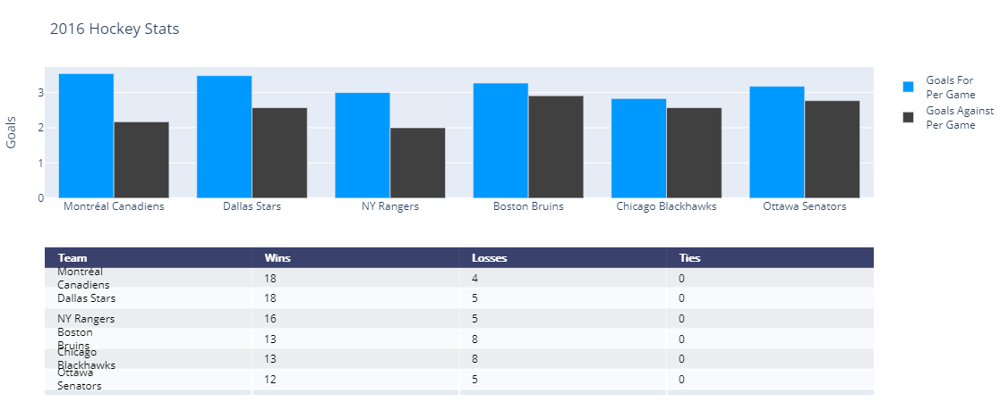

In [23]:
import plotly.graph_objs as go
import plotly.figure_factory as ff

# Add table data
table_data = [['Team', 'Wins', 'Losses', 'Ties'],
              ['Montréal<br>Canadiens', 18, 4, 0],
              ['Dallas Stars', 18, 5, 0],
              ['NY Rangers', 16, 5, 0],
              ['Boston<br>Bruins', 13, 8, 0],
              ['Chicago<br>Blackhawks', 13, 8, 0],
              ['Ottawa<br>Senators', 12, 5, 0]]
# Initialize a fig with ff.create_table(table_data)
fig = ff.create_table(table_data, height_constant=60)

# Add graph data
teams = ['Montréal Canadiens', 'Dallas Stars', 'NY Rangers',
         'Boston Bruins', 'Chicago Blackhawks', 'Ottawa Senators']
GFPG = [3.54, 3.48, 3.0, 3.27, 2.83, 3.18]
GAPG = [2.17, 2.57, 2.0, 2.91, 2.57, 2.77]

fig.add_trace(go.Bar(x=teams, y=GFPG, xaxis='x2', yaxis='y2',
                marker=dict(color='#0099ff'),
                name='Goals For<br>Per Game'))

fig.add_trace(go.Bar(x=teams, y=GAPG, xaxis='x2', yaxis='y2',
                marker=dict(color='#404040'),
                name='Goals Against<br>Per Game'))

fig.update_layout(
    title_text = '2016 Hockey Stats',
    height = 800,
    margin = {'t':75, 'l':50},
    yaxis = {'domain': [0, .45]},
    xaxis2 = {'anchor': 'y2'},
    yaxis2 = {'domain': [.6, 1], 'anchor': 'x2', 'title': 'Goals'}
)

fig.show()

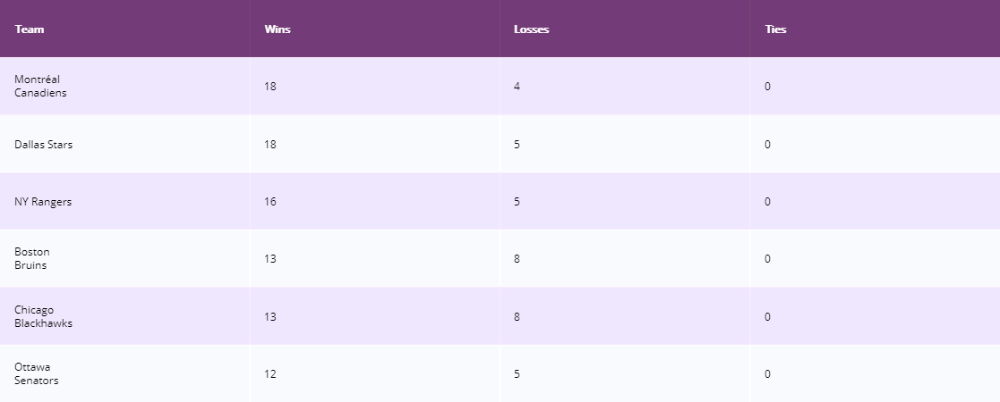

In [24]:
import plotly.figure_factory as ff
import pandas as pd

colorscale = [[0, '#4d004c'],[.5, '#f2e5ff'],[1, '#ffffff']]

fig =  ff.create_table(table_data, colorscale=colorscale)

fig.show()

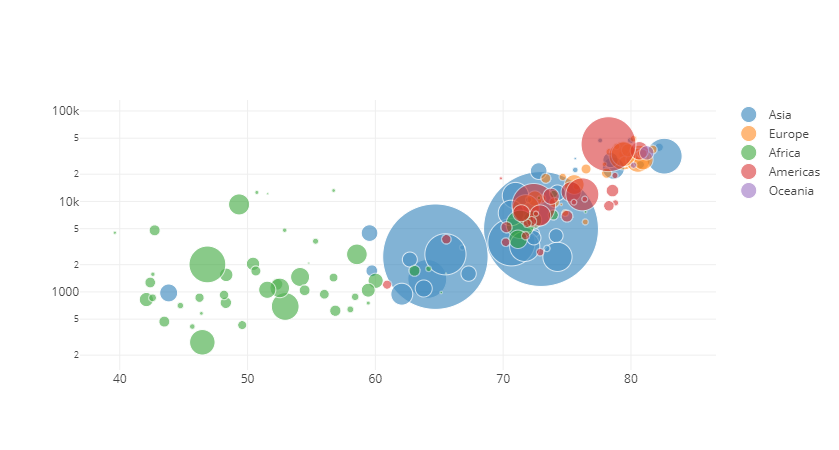

In [25]:
import plotly.io as pio
import pandas as pd

df = pd.read_csv("..\\JN_DataWarehouse\\plotly\\gapminderDataFiveYear.csv")

colors = ['blue', 'orange', 'green', 'red', 'purple']

opt = []
opts = []
for i in range(0, len(colors)):
    opt = dict(
        target = df['continent'][[i]].unique(), value = dict(marker = dict(color = colors[i]))
    )
    opts.append(opt)

data = [dict(
  type = 'scatter',
  mode = 'markers',
  x = df['lifeExp'],
  y = df['gdpPercap'],
  text = df['continent'],
  hoverinfo = 'text',
  opacity = 0.8,
  marker = dict(
      size = df['pop'],
      sizemode = 'area',
      sizeref = 200000
  ),
  transforms = [
      dict(
        type = 'filter',
        target = df['year'],
        orientation = '=',
        value = 2007
      ),
      dict(
        type = 'groupby',
        groups = df['continent'],
        styles = opts
    )]
)]

layout = dict(
    yaxis = dict(
        type = 'log'
    )
)

fig_dict = dict(data=data, layout=layout)
pio.show(fig_dict, validate=False)

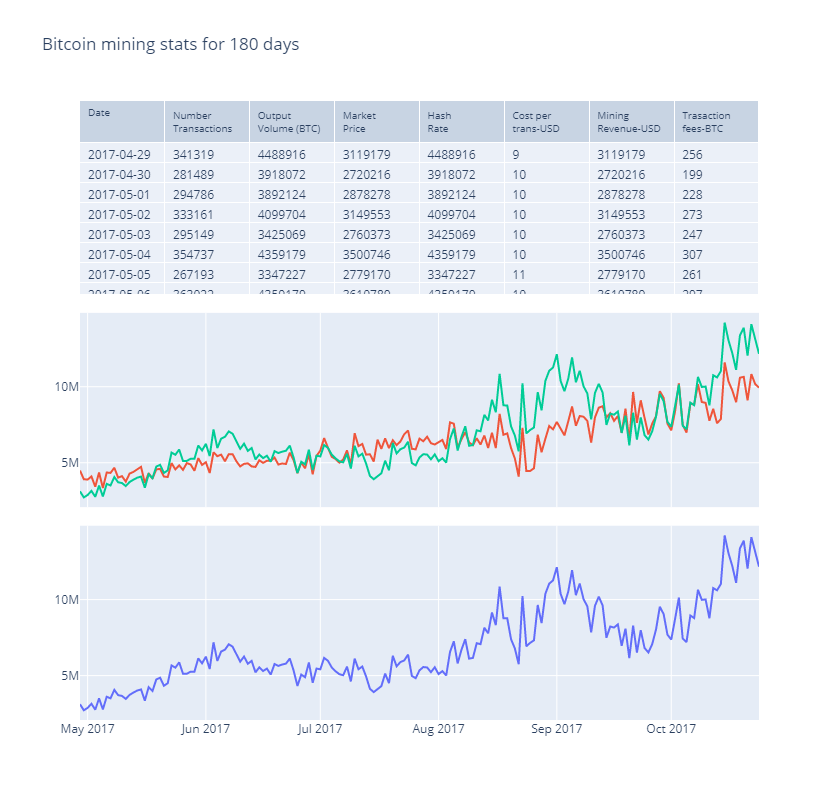

In [4]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import pandas as pd
import re

df = pd.read_csv("..\\JN_DataWarehouse\\plotly\\Mining-BTC-180.csv")

for i, row in enumerate(df["Date"]):
    p = re.compile(" 00:00:00")
    datetime = p.split(df["Date"][i])[0]
    df.iloc[i, 1] = datetime

fig = make_subplots(
    rows=3, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.03,
    specs=[[{"type": "table"}],
           [{"type": "scatter"}],
           [{"type": "scatter"}]]
)

fig.add_trace(
    go.Scatter(
        x=df["Date"],
        y=df["Mining-revenue-USD"],
        mode="lines",
        name="mining revenue"
    ),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(
        x=df["Date"],
        y=df["Hash-rate"],
        mode="lines",
        name="hash-rate-TH/s"
    ),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(
        x=df["Date"],
        y=df["Mining-revenue-USD"],
        mode="lines",
        name="mining revenue"
    ),
    row=2, col=1
)


fig.add_trace(
    go.Table(
        header=dict(
            values=["Date", "Number<br>Transactions", "Output<br>Volume (BTC)",
                    "Market<br>Price", "Hash<br>Rate", "Cost per<br>trans-USD",
                    "Mining<br>Revenue-USD", "Trasaction<br>fees-BTC"],
            font=dict(size=10),
            align="left"
        ),
        cells=dict(
            values=[df[k].tolist() for k in df.columns[1:]],
            align = "left")
    ),
    row=1, col=1
)
fig.update_layout(
    height=800,
    showlegend=False,
    title_text="Bitcoin mining stats for 180 days",
)

fig.show()

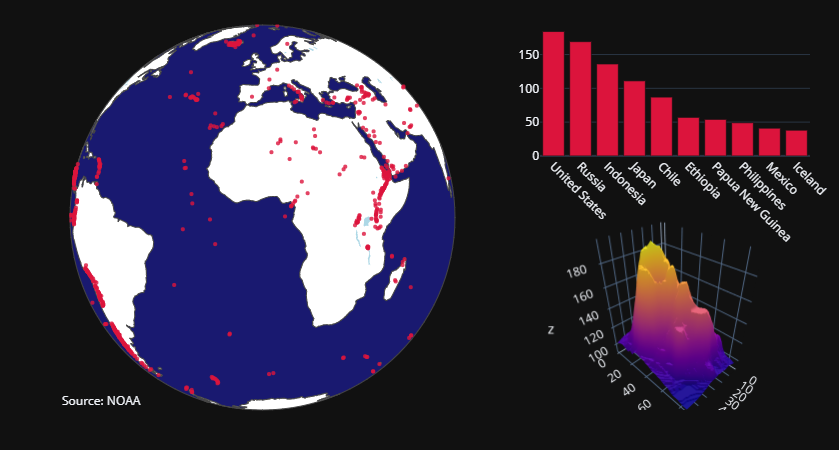

In [27]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import pandas as pd

# read in volcano database data
df = pd.read_csv(
    "..\\JN_DataWarehouse\\plotly\\volcano_db.csv",
    encoding="iso-8859-1",
)

# frequency of Country
freq = df
freq = freq.Country.value_counts().reset_index().rename(columns={"index": "x"})

# read in 3d volcano surface data
df_v = pd.read_csv("..\\JN_DataWarehouse\\plotly\\volcano.csv")

# Initialize figure with subplots
fig = make_subplots(
    rows=2, cols=2,
    column_widths=[0.6, 0.4],
    row_heights=[0.4, 0.6],
    specs=[[{"type": "scattergeo", "rowspan": 2}, {"type": "bar"}],
           [            None                    , {"type": "surface"}]])

# Add scattergeo globe map of volcano locations
fig.add_trace(
    go.Scattergeo(lat=df["Latitude"],
                  lon=df["Longitude"],
                  mode="markers",
                  hoverinfo="text",
                  showlegend=False,
                  marker=dict(color="crimson", size=4, opacity=0.8)),
    row=1, col=1
)

# Add locations bar chart
fig.add_trace(
    go.Bar(x=freq["x"][0:10],y=freq["Country"][0:10], marker=dict(color="crimson"), showlegend=False),
    row=1, col=2
)

# Add 3d surface of volcano
fig.add_trace(
    go.Surface(z=df_v.values.tolist(), showscale=False),
    row=2, col=2
)

# Update geo subplot properties
fig.update_geos(
    projection_type="orthographic",
    landcolor="white",
    oceancolor="MidnightBlue",
    showocean=True,
    lakecolor="LightBlue"
)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)

# Set theme, margin, and annotation in layout
fig.update_layout(
    template="plotly_dark",
    margin=dict(r=10, t=25, b=40, l=60),
    annotations=[
        dict(
            text="Source: NOAA",
            showarrow=False,
            xref="paper",
            yref="paper",
            x=0,
            y=0)
    ]
)

fig.show()

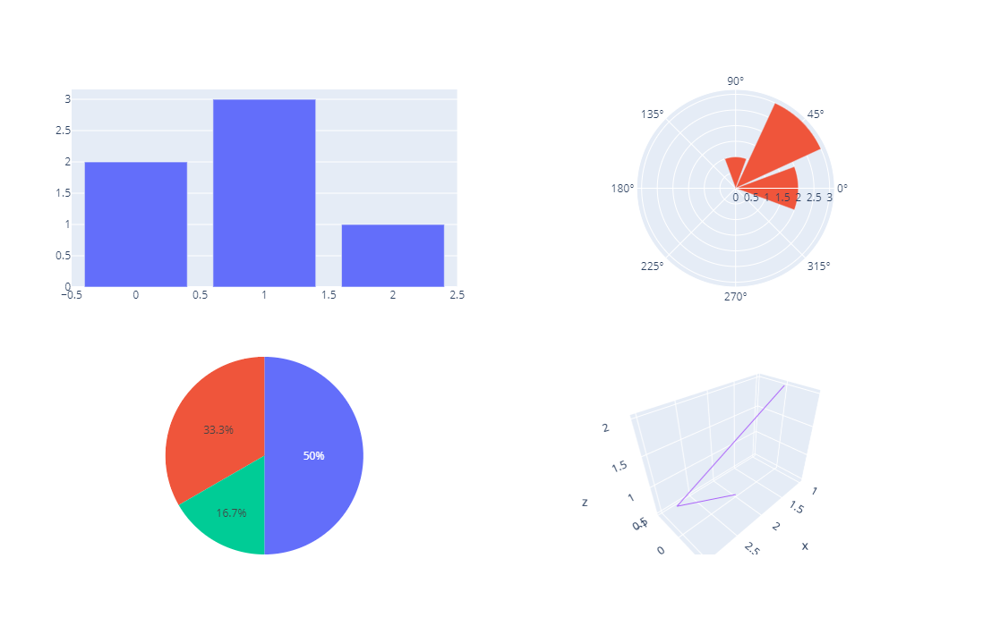

In [1]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(
    rows=2, cols=2,
    specs=[[{"type": "xy"}, {"type": "polar"}],
           [{"type": "domain"}, {"type": "scene"}]],
)

fig.add_trace(go.Bar(y=[2, 3, 1]), row=1, col=1)

fig.add_trace(go.Barpolar(theta=[0, 45, 90], r=[2, 3, 1]), row=1, col=2)

fig.add_trace(go.Pie(values=[2, 3, 1]), row=2, col=1)

fig.add_trace(go.Scatter3d(x=[2, 3, 1], y=[0, 0, 0], z=[0.5, 1, 2], mode="lines"), row=2, col=2)

fig.update_layout(height=700, showlegend=False)

fig.show()

In [28]:
#help(go.FigureWidget)

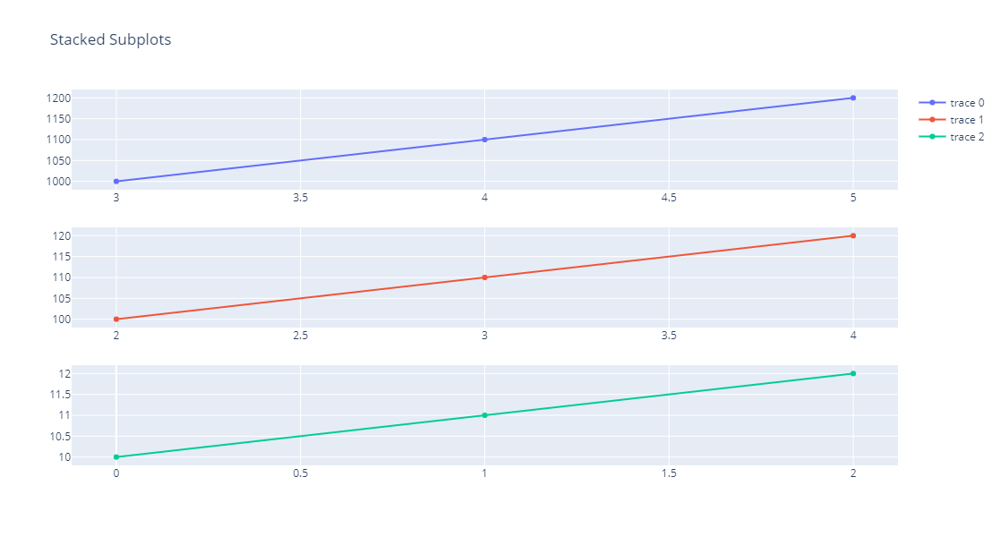

In [2]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=3, cols=1)

fig.append_trace(go.Scatter( x=[3, 4, 5], y=[1000, 1100, 1200],), row=1, col=1)
fig.append_trace(go.Scatter( x=[2, 3, 4], y=[100, 110, 120],), row=2, col=1)
fig.append_trace(go.Scatter( x=[0, 1, 2], y=[10, 11, 12]), row=3, col=1)

fig.update_layout(height=600, width=600, title_text="Stacked Subplots")
fig.show()